In [56]:
pip install igraph


     ---------------------------------------- 2.8/2.8 MB 11.9 MB/s eta 0:00:00
  Using cached texttable-1.6.4-py2.py3-none-any.whl (10 kB)


You should consider upgrading via the 'C:\Users\KKo1\Anaconda3\envs\py38\python.exe -m pip install --upgrade pip' command.


In [58]:
pip install louvain


  Using cached louvain-0.7.1-cp39-cp39-win_amd64.whl (94 kB)


You should consider upgrading via the 'C:\Users\KKo1\Anaconda3\envs\py38\python.exe -m pip install --upgrade pip' command.


In [1]:
import pandas as pd
import scanpy as sc
import numpy as np
from numpy import linalg as la
from scipy.sparse import issparse
import loompy
import anndata
import scvelo as scv
scv.logging.print_version()

Running scvelo 0.2.5 (python 3.8.16) on 2023-05-10 14:54.


In [2]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white')

scanpy==1.9.3 anndata==0.9.1 umap==0.5.3 numpy==1.23.5 scipy==1.10.1 pandas==1.3.5 scikit-learn==1.0.2 statsmodels==0.13.5 python-igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.5


In [3]:
import os
os.chdir('F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4')

In [4]:
import scanpy.external as sce

# Epithelial cells

In [5]:
# all are epithelial cell datasets
# file names are incorrect

adata_A = sc.read('Group_A_epithelial_immune.h5ad')
adata_B = sc.read('Group_B_epithelial_immune.h5ad')
adata_C = sc.read('Group_C_epithelial_immune.h5ad')

In [6]:
adata_epi= adata_A.concatenate(adata_B, adata_C)

In [7]:
adata_epi.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,GOBP_notch_score,GOBP_wnt_score,GOBP_hippo_score,GOBP_cellcycle_score,GOBP_histone_score,GOBP_pi3k_score,celltype,crude,celltype_detail,dataset
AAACCTGAGCTAAACA-1-0-0-0,2747.0,2630,1283.869751,19.201120,1.495566,tumor,P686,8,0,161.193115,...,0.005145,0.064308,-0.003498,0.026385,-0.045633,0.042776,epithelial,epithelial,epithelial,NaN
AAACCTGAGCTGCAAG-1-0-0-0,696.0,664,821.045593,22.309502,2.717206,tumor,P686,18,0,97.282425,...,-0.026850,0.043098,-0.023160,0.019255,-0.034572,-0.058895,epithelial,epithelial,epithelial,NaN
AAACCTGAGTACGTAA-1-0-0-0,366.0,354,642.963806,39.510632,6.145079,tumor,P686,8,0,109.494339,...,-0.048368,0.062410,-0.027361,0.025115,0.036140,0.036661,epithelial,epithelial,epithelial,NaN
AAACCTGCACTGAAGG-1-0-0-0,720.0,699,956.075134,19.870264,2.078316,tumor,P686,26,0,186.630081,...,-0.011385,-0.045636,0.237536,-0.013321,-0.050716,-0.010067,epithelial,epithelial,epithelial,NaN
AAACCTGGTGCACCAC-1-0-0-0,1406.0,1366,388.112122,6.067459,1.563326,tumor,P686,17,0,75.051537,...,-0.015240,-0.011150,-0.014254,-0.010753,-0.027467,-0.025247,epithelial,epithelial,epithelial,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTCACAAGACGTG-1-60-0-2,NaN,4055,2505.033691,3.604661,0.143897,tumor,P079,35,2,200.048752,...,-0.034226,-0.038333,0.094702,0.164452,0.068549,-0.096092,epithelial,epithelial,epithelial,NaN
TTTGTCACAGGTCTCG-1-60-0-2,NaN,2571,2158.090820,0.000000,0.000000,tumor,P079,35,2,230.678619,...,0.015039,-0.014334,0.023215,0.014408,-0.000805,-0.078653,epithelial,epithelial,epithelial,NaN
TTTGTCAGTAGCGCTC-1-60-0-2,NaN,2401,2428.530029,40.010536,1.647521,tumor,P079,35,2,164.578796,...,0.193945,0.057855,0.083611,0.065215,0.005955,-0.026242,epithelial,epithelial,epithelial,NaN
TTTGTCATCGACCAGC-1-60-0-2,NaN,3596,2603.228271,14.866852,0.571093,tumor,P079,35,2,203.210175,...,0.126555,0.026573,-0.120487,-0.007144,-0.038660,-0.083429,epithelial,epithelial,epithelial,NaN


In [8]:
adata_epi

AnnData object with n_obs × n_vars = 138849 × 11060
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'source', 'patient_cluster', 'Notch_score', 'Tp53_score', 'Cdkn2a_score', 'NFkB_score', 'GOBP_tgfb_score', 'GOBP_notch_score', 'GOBP_wnt_score', 'GOBP_hippo_score', 'GOBP_cellcycle_score', 'GOBP_histone_score', 'GOBP_pi3k_score', 'celltype', 'crude', 'celltype_detail', 'dataset'
    var: 'gene_ids', 'mt', 'ribo', 'hb', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-10-0', 'n_cells_by_counts-10-0', 'mean_counts-10-0', 'pct_dropout_by_counts-10-0', 'total_counts-10-0', 'n_cells-11-0', 'n_cells_by_counts-11-0', '

In [9]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T_1': ['P010','P008','P021','P049','P020','P062','P032','P016','P061','P012',
                     'P057','P015','P065','P063','P130','P056', 'P011','P127','P126','P001',
                     'P028','P027','P030'],
             'T_2': ['P037','P031','P026','P042','P019','P017','P036','P054','P023','P128',
                     'P048','P002','P104','P087','P094','P084','P079','P107','P076','P089',
                     'P083'],
                     
                   
             'T_3': [ 'P986','P658','P836','P866','P846','P686','P865','P585','P944','P787'],
             'T_4': ['P052','P024','P040','P039','P080','P075','P091','P009B','P082','P022',
                     'P074','P047','P038','P044','P009A']
              }

# Initialize empty column in cell metadata
adata_epi.obs['T_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_epi.obs.patient).isin(cell_dict[i])
    adata_epi.obs.loc[ind,'T_patient_cluster4'] = i


In [10]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Myeloid_1': ['P063','P056','P009B','P075','P011','P032','P016','P104','P087','P089','P036','P083','P052',
                          'P047','P037','P091','P022','P074','P038','P082'],
            'Myeloid_2':  ['P130','P010','P986','P865','P585','P866','P846','P686','P658','P944','P836','P787'],
             'Myeloid_3': ['P040','P024','P017','P031','P026','P023','P049','P021','P107','P076','P079','P048','P062',
                          'P027','P065','P057','P008','P044','P001','P042','P094','P084','P080','P002','P061','P015'],
             'Myeloid_4': ['P128','P054','P019','P127','P126','P030','P028','P039','P020','P012'],
             'No_M': ['P009A']
              }

# Initialize empty column in cell metadata
adata_epi.obs['Myeloid_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_epi.obs.patient).isin(cell_dict[i])
    adata_epi.obs.loc[ind,'Myeloid_patient_cluster4'] = i


In [11]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_epi.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_epi.obs.patient).isin(cell_dict[i])
    adata_epi.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


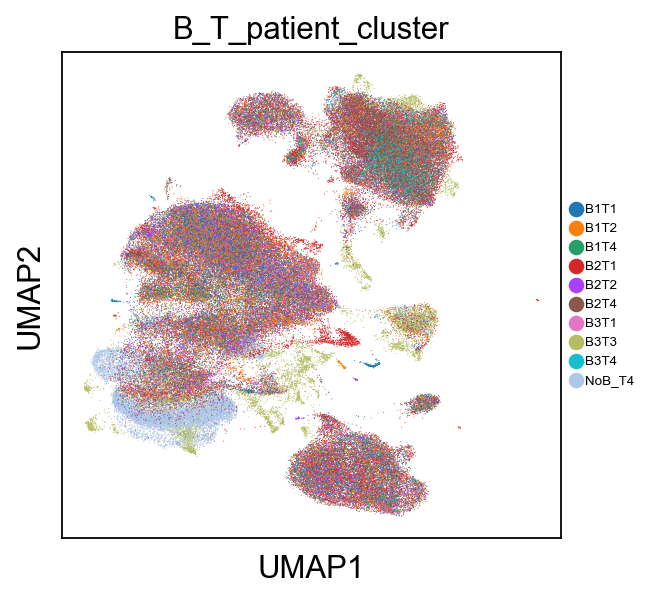

In [12]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'B1T1': ["P065",	"P062",	"P030",	"P012",	"P027",	"P028",	"P126",	"P127",],
             'B1T2':["P104",	"P128",	"P048",	"P094",	"P054",	"P079",	"P076",	"P023",	"P087",	"P019",	"P036",],
             'B1T3':[],
             'B1T4':["P040",	"P052",],
            
             'B2T1': ["P057",	"P063",	"P056",	"P008",	"P001",	"P130",	"P011",	"P061",	"P010",	"P021",	"P015",	"P020",	"P032",	"P049",	"P016",],
            'B2T2': ["P002",	"P084",	"P017",	"P026",	"P042",	"P083",	"P037",	"P089",],
             'B2T3':[],
             'B2T4':["P074",	"P039",	"P075",	"P091",	"P009B",	"P024",	"P022",	"P080",	"P082",	"P047",	"P038",],
 
             'B3T1': ["P031",	"P107",],
             'B3T2':[],
             'B3T3':["P866",	"P836",	"P846",	"P986",	"P585",	"P658",	"P865",	"P944",	"P787",	"P686",],
             'B3T4':["P044",],
             'NoB_T4':['P009A']
             
              }

# Initialize empty column in cell metadata
adata_epi.obs['B_T_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_epi.obs.patient).isin(cell_dict[i])
    adata_epi.obs.loc[ind,'B_T_patient_cluster'] = i

sc.pl.umap(adata_epi, color=['B_T_patient_cluster'], legend_loc='right margin', legend_fontsize=6,)# save='umap_Fibro_T_patient_cluster_in_T_cell.pdf')


ranking genes
    finished: added to `.uns['B_T_class_rank_in_epi']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:07:04)


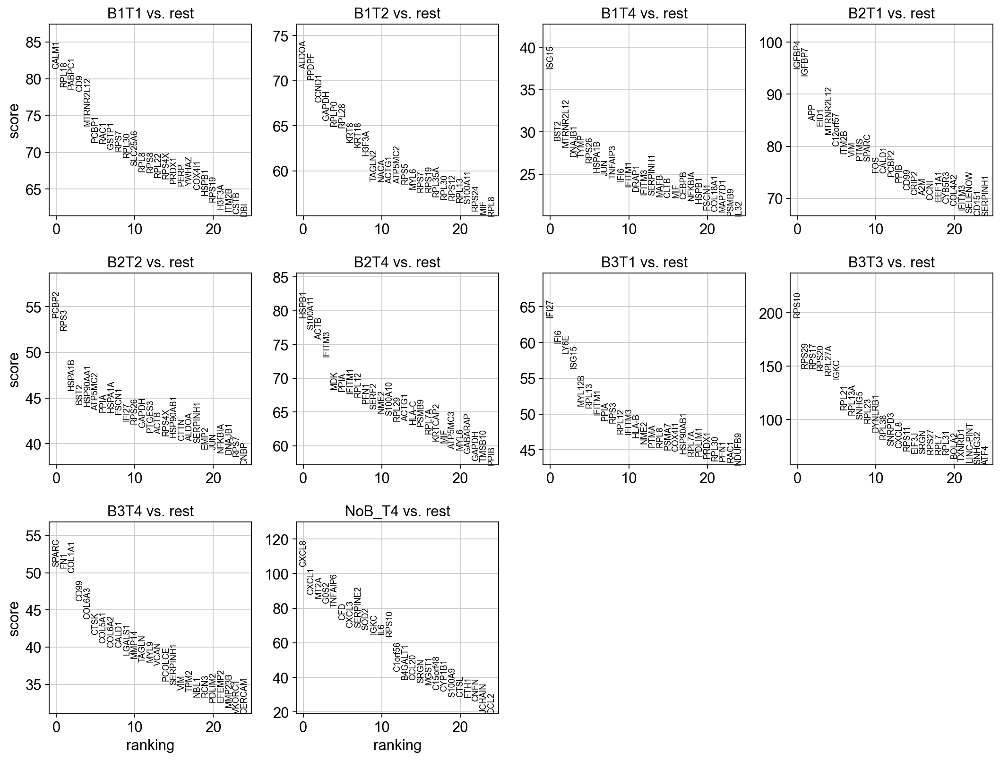

In [13]:
sc.tl.rank_genes_groups(adata_epi, 'B_T_patient_cluster', method='wilcoxon', key_added = "B_T_class_rank_in_epi")
sc.pl.rank_genes_groups(adata_epi, n_genes=25, sharey=False, key = "B_T_class_rank_in_epi")

In [15]:
df=pd.DataFrame(adata_epi.uns['B_T_class_rank_in_epi']['names'])
df.to_csv("F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/B_T_Cell_in_epi.csv",
                 sep=',', na_rep='', float_format=None, columns=None, header=True, 
                 index=True, index_label=None, mode='w', encoding=None, compression='infer', 
                 quoting=None, quotechar='"', line_terminator=None, chunksize=None, date_format=None)

# Check

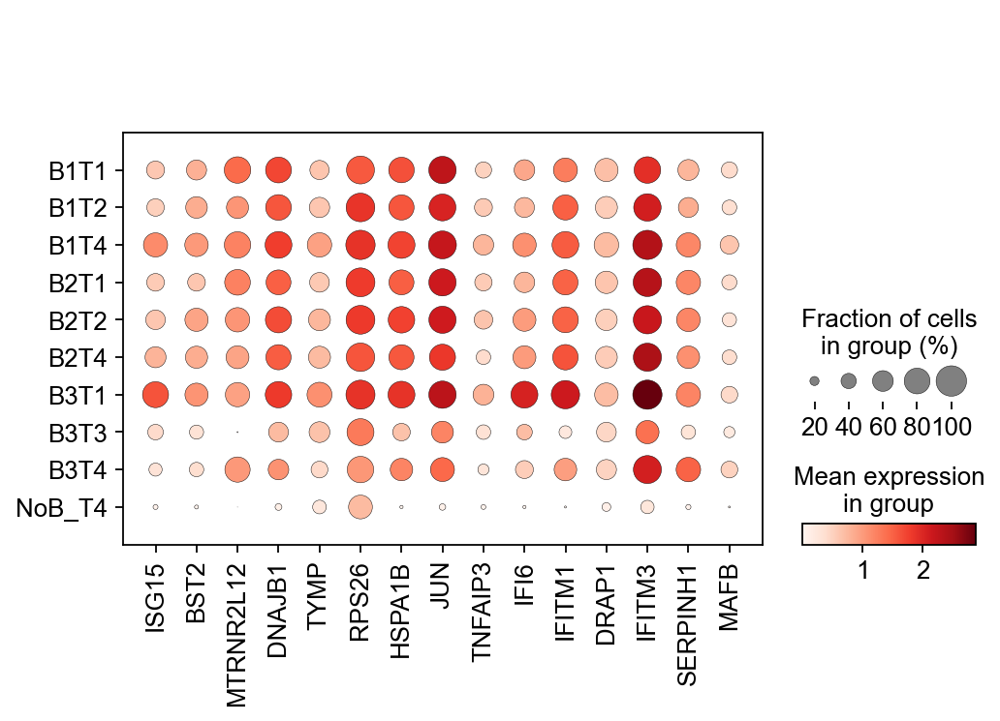

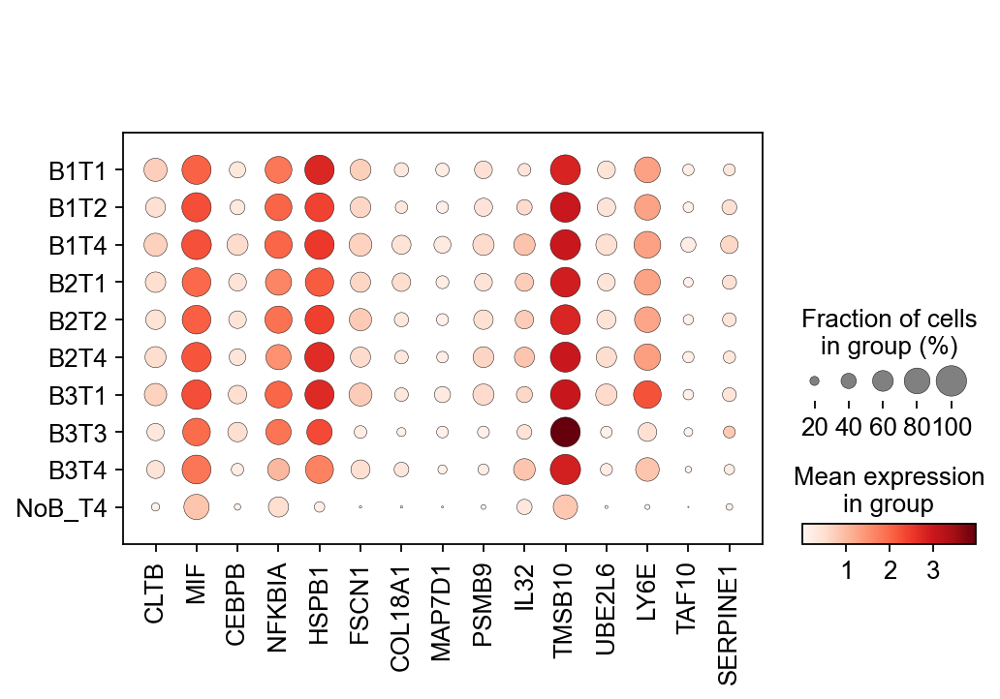

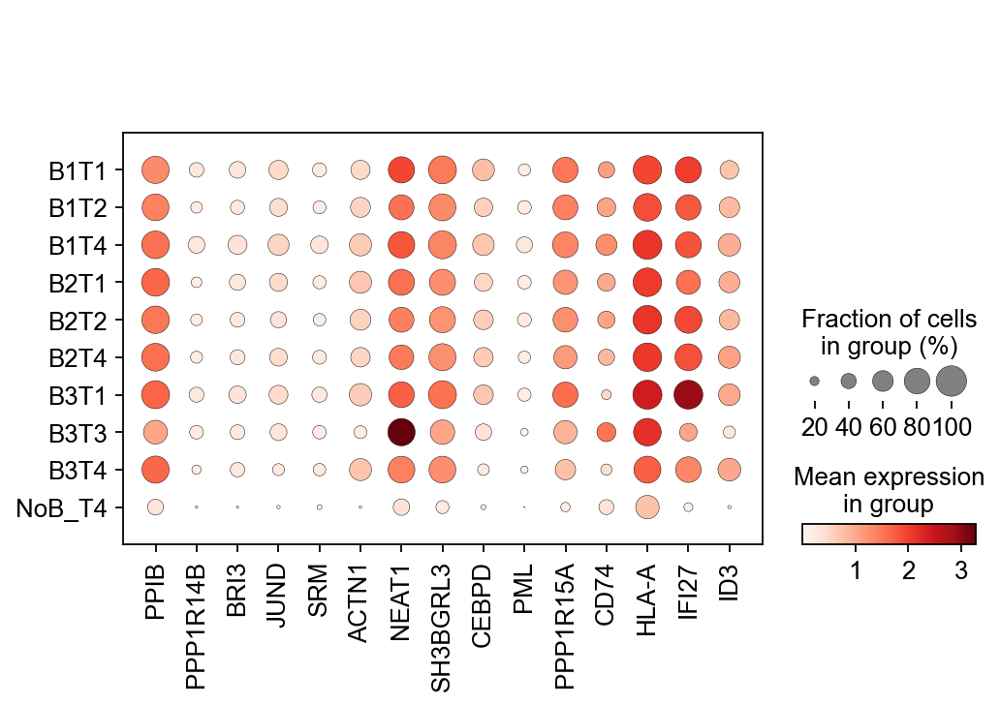

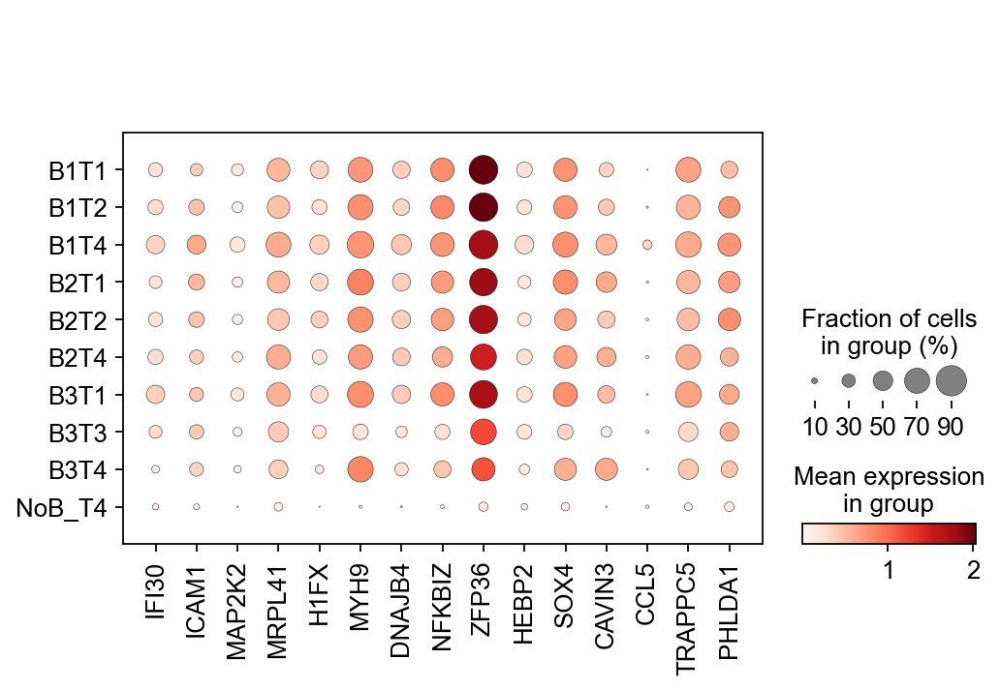

In [16]:
#B1T4
sc.pl.dotplot(adata_epi, ["ISG15",	"BST2",	"MTRNR2L12",	"DNAJB1",	"TYMP",	"RPS26",	"HSPA1B",	"JUN",	"TNFAIP3",	"IFI6",	"IFITM1",	"DRAP1",	"IFITM3",	"SERPINH1",	"MAFB",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["CLTB",	"MIF",	"CEBPB",	"NFKBIA",	"HSPB1",	"FSCN1",	"COL18A1",	"MAP7D1",	"PSMB9",	"IL32",	"TMSB10",	"UBE2L6",	"LY6E",	"TAF10",	"SERPINE1",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["PPIB",	"PPP1R14B",	"BRI3",	"JUND",	"SRM",	"ACTN1",	"NEAT1",	"SH3BGRL3",	"CEBPD",	"PML",	"PPP1R15A",	"CD74",	"HLA-A",	"IFI27",	"ID3",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["IFI30",	"ICAM1",	"MAP2K2",	"MRPL41",	"H1FX",	"MYH9",	"DNAJB4",	"NFKBIZ",	"ZFP36",	"HEBP2",	"SOX4",	"CAVIN3",	"CCL5",	"TRAPPC5",	"PHLDA1",
], groupby=['B_T_patient_cluster'])

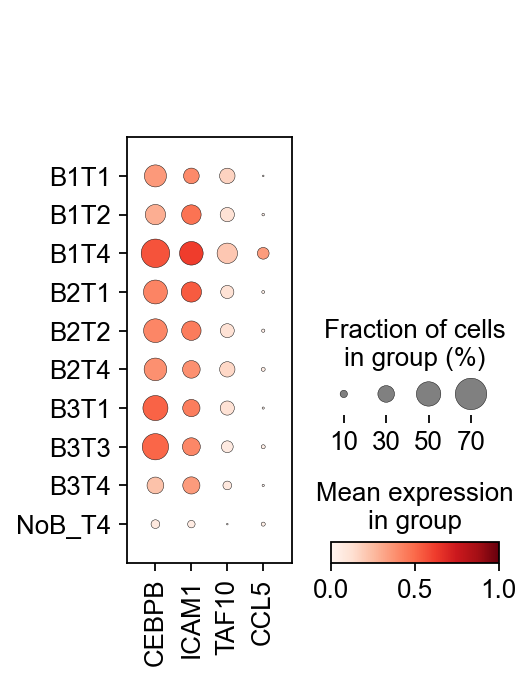

In [20]:
#B1T4
#NDUFS8, MRPL41, GABARAP, MYL6
sc.pl.dotplot(adata_epi, ["CEBPB","ICAM1","TAF10","CCL5"],vmin=0, vmax=1, groupby=['B_T_patient_cluster'],save='epi_B1T4_markers.pdf')


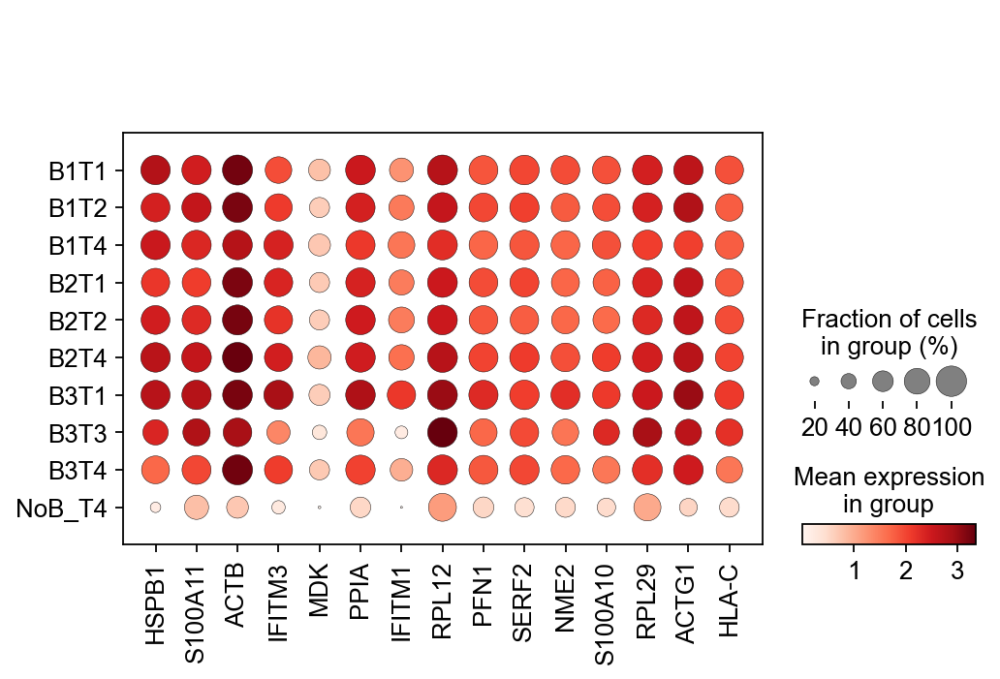

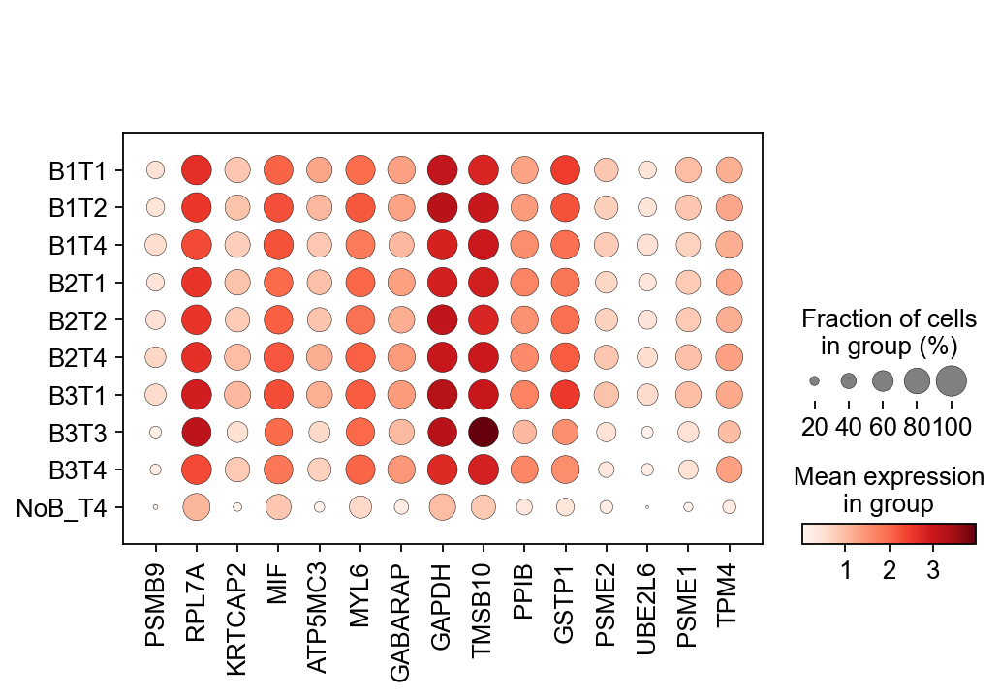

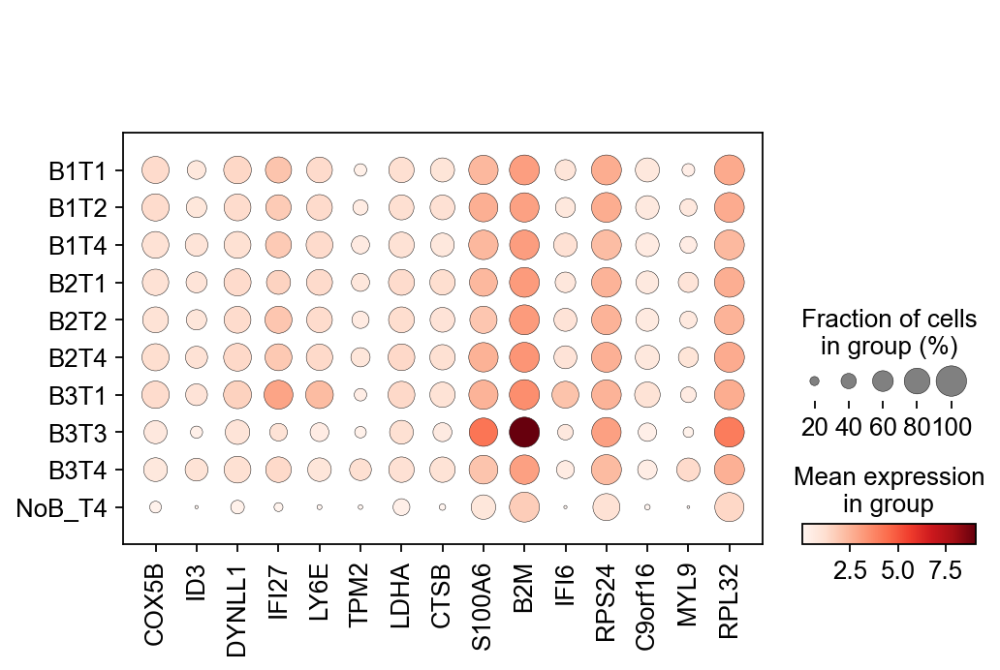

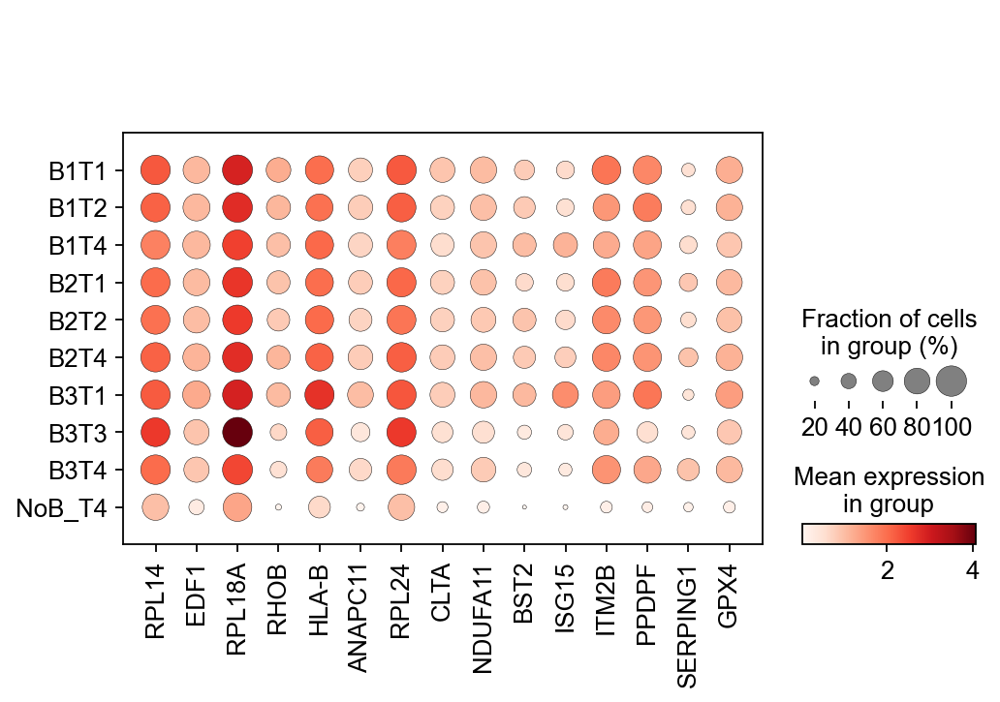

In [21]:
#B2T4
sc.pl.dotplot(adata_epi, ["HSPB1",	"S100A11",	"ACTB",	"IFITM3",	"MDK",	"PPIA",	"IFITM1",	"RPL12",	"PFN1",	"SERF2",	"NME2",	"S100A10",	"RPL29",	"ACTG1",	"HLA-C",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["PSMB9",	"RPL7A",	"KRTCAP2",	"MIF",	"ATP5MC3",	"MYL6",	"GABARAP",	"GAPDH",	"TMSB10",	"PPIB",	"GSTP1",	"PSME2",	"UBE2L6",	"PSME1",	"TPM4",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["COX5B",	"ID3",	"DYNLL1",	"IFI27",	"LY6E",	"TPM2",	"LDHA",	"CTSB",	"S100A6",	"B2M",	"IFI6",	"RPS24",	"C9orf16",	"MYL9",	"RPL32",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["RPL14",	"EDF1",	"RPL18A",	"RHOB",	"HLA-B",	"ANAPC11",	"RPL24",	"CLTA",	"NDUFA11",	"BST2",	"ISG15",	"ITM2B",	"PPDPF",	"SERPING1",	"GPX4",
], groupby=['B_T_patient_cluster'])

In [22]:
#B2T4
sc.pl.dotplot(adata_epi, [], groupby=['B_T_patient_cluster'],save='epi_B2T4_markers.pdf')
# No specific marker genes

ValueError: groupby has to be a valid observation. Given Fibro_T_patient_cluster, is not in observations: ['n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'source', 'patient_cluster', 'Notch_score', 'Tp53_score', 'Cdkn2a_score', 'NFkB_score', 'GOBP_tgfb_score', 'GOBP_notch_score', 'GOBP_wnt_score', 'GOBP_hippo_score', 'GOBP_cellcycle_score', 'GOBP_histone_score', 'GOBP_pi3k_score', 'celltype', 'crude', 'celltype_detail', 'dataset', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44', 'B_T_patient_cluster']

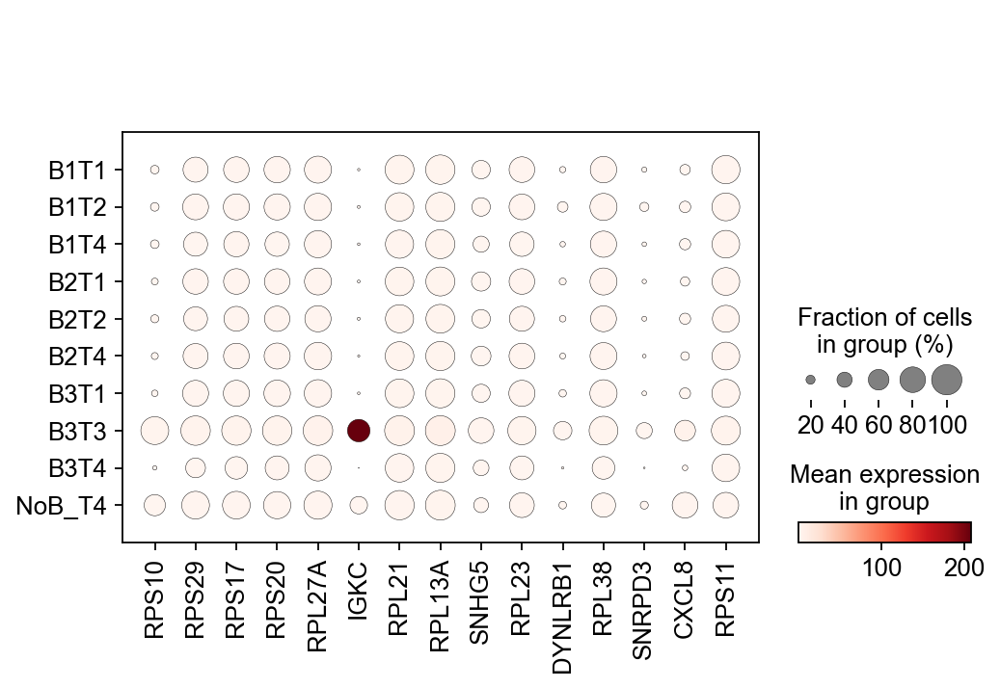

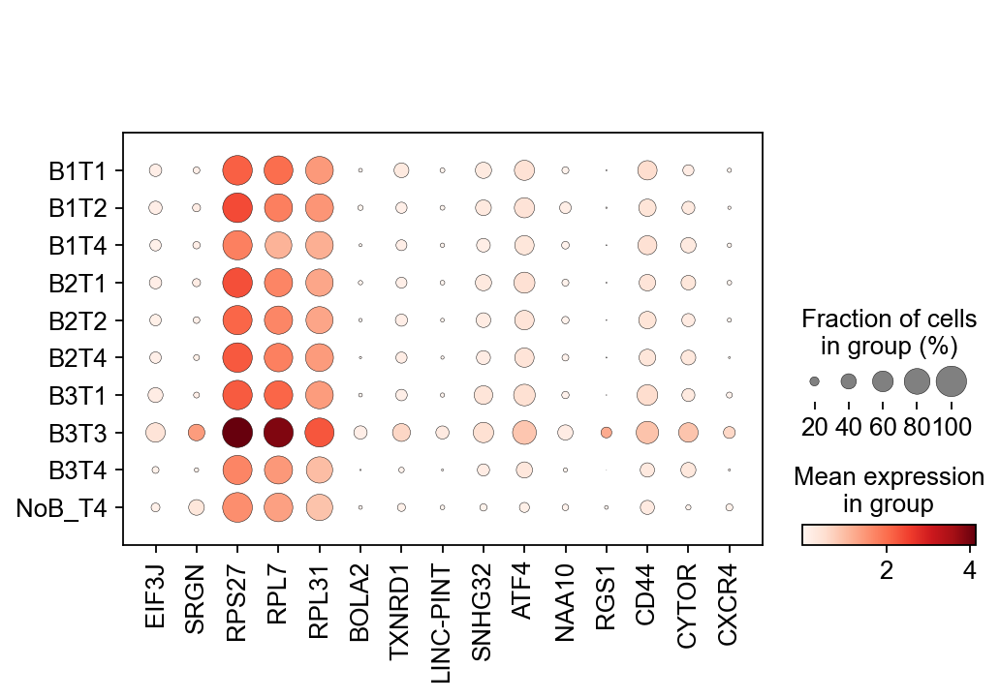

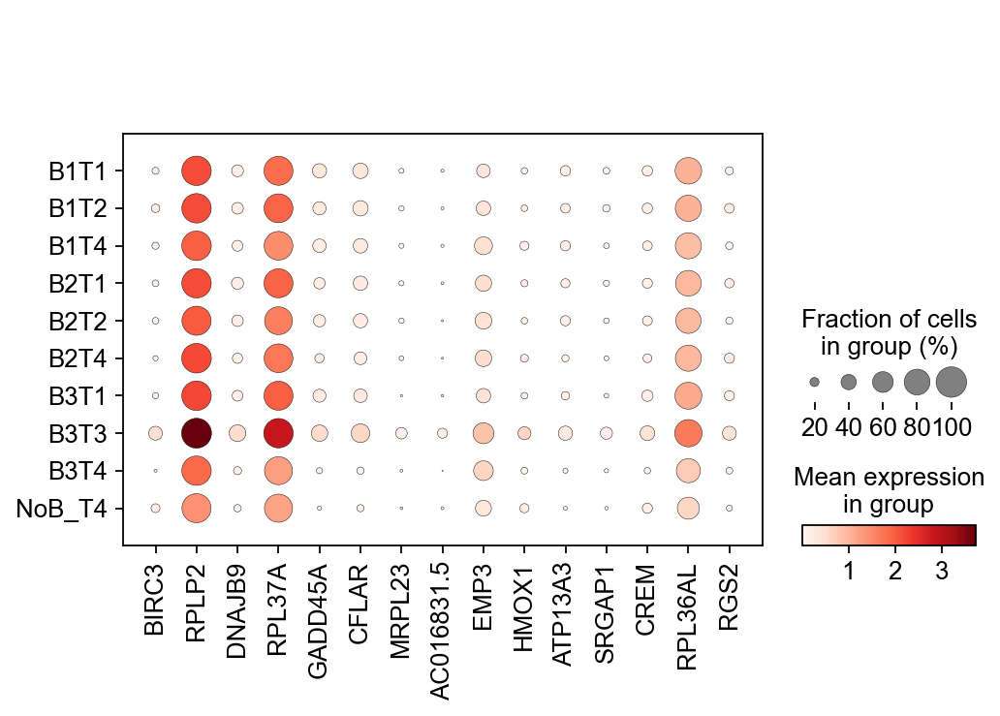

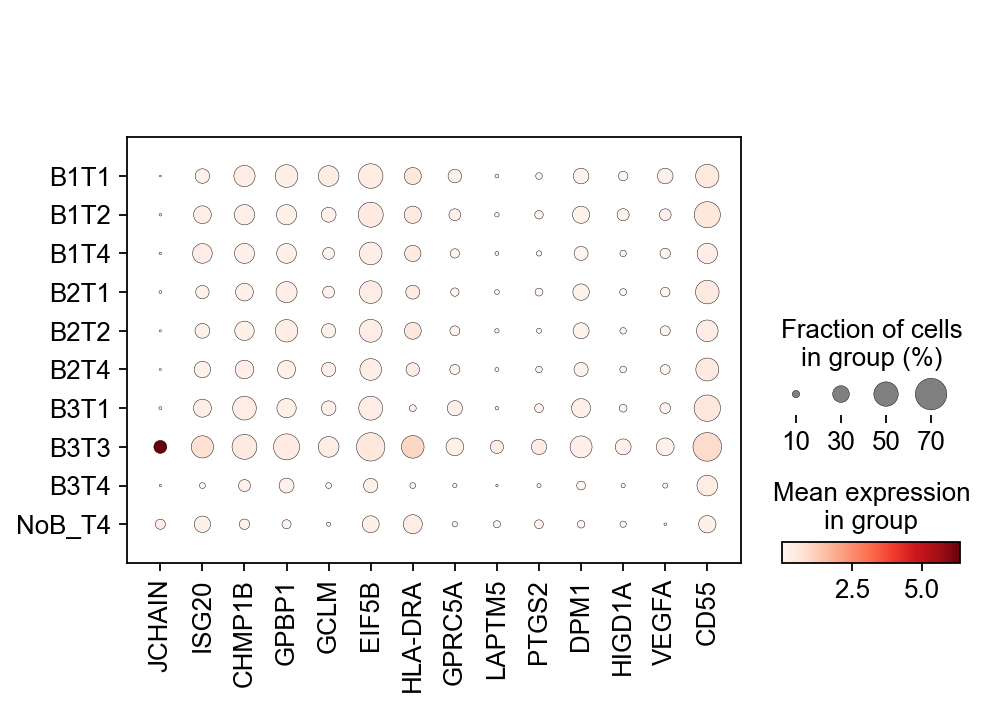

In [23]:
#B3T3
sc.pl.dotplot(adata_epi, ["RPS10",	"RPS29",	"RPS17",	"RPS20",	"RPL27A",	"IGKC",	"RPL21",	"RPL13A",	"SNHG5",	"RPL23",	"DYNLRB1",	"RPL38",	"SNRPD3",	"CXCL8",	"RPS11",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["EIF3J",	"SRGN",	"RPS27",	"RPL7",	"RPL31",	"BOLA2",	"TXNRD1",	"LINC-PINT",	"SNHG32",	"ATF4",	"NAA10",	"RGS1",	"CD44",	"CYTOR",	"CXCR4",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["BIRC3",	"RPLP2",	"DNAJB9",	"RPL37A",	"GADD45A",	"CFLAR",	"MRPL23",	"AC016831.5",	"EMP3",	"HMOX1",	"ATP13A3",	"SRGAP1",	"CREM",	"RPL36AL",	"RGS2",
], groupby=['B_T_patient_cluster'])
sc.pl.dotplot(adata_epi, ["JCHAIN",	"ISG20",	"CHMP1B",	"GPBP1",	"GCLM",	"EIF5B",	"HLA-DRA",	"GPRC5A",	"LAPTM5",	"PTGS2",	"DPM1",	"HIGD1A",	"VEGFA",	"CD55",
], groupby=['B_T_patient_cluster'])


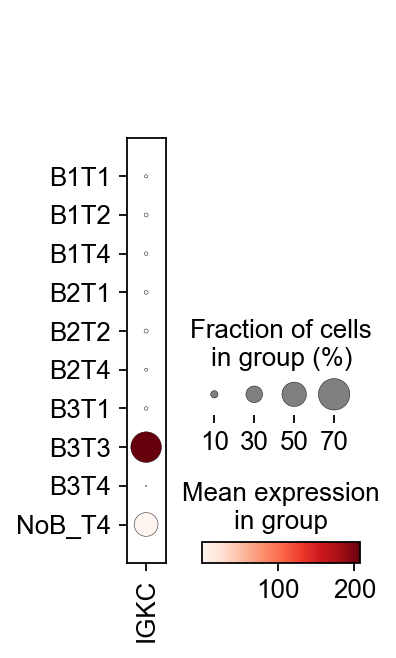

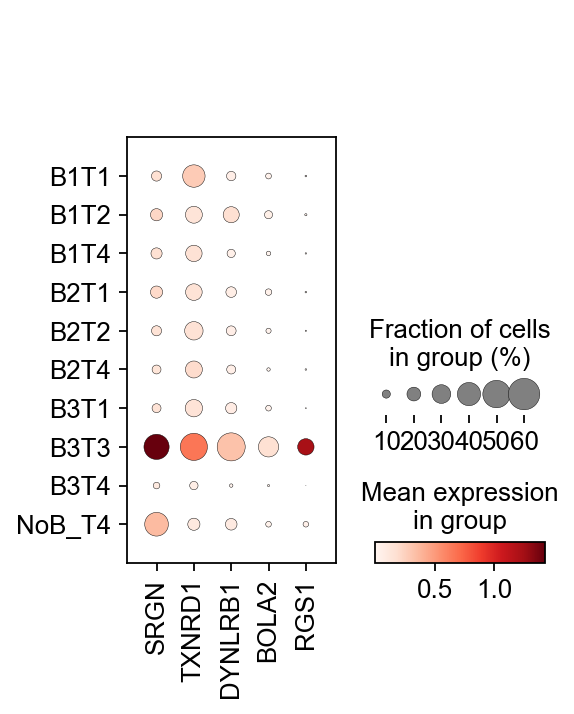

In [27]:
#B3T3
#SNRPD3 good prognosis
sc.pl.dotplot(adata_epi, ["IGKC"], 
              groupby=['B_T_patient_cluster'],save='epi_B3T3_markers.pdf')
sc.pl.dotplot(adata_epi, ["SRGN","TXNRD1","DYNLRB1","BOLA2","RGS1"], 
              groupby=['B_T_patient_cluster'],save='epi_B3T3_markers.pdf')

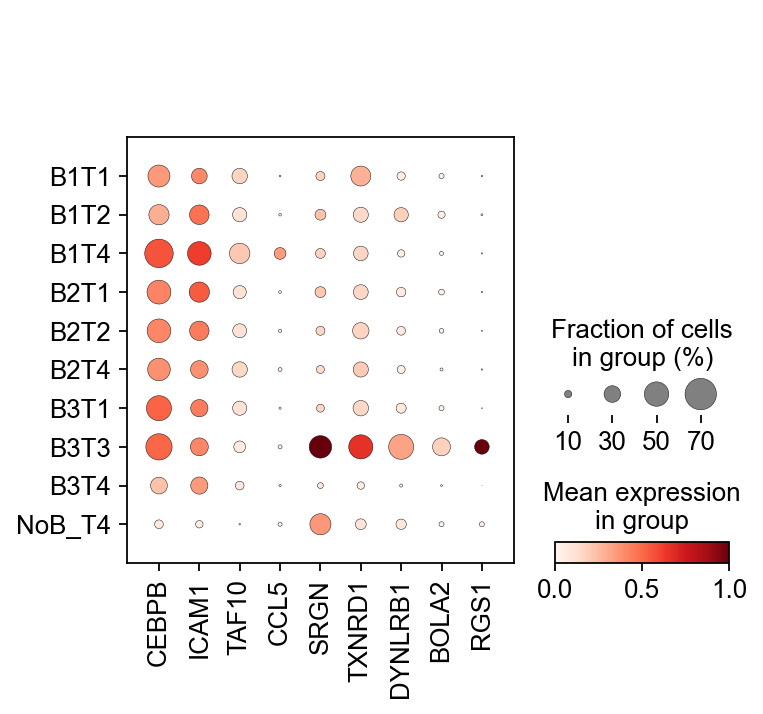

In [29]:
#B1T4, B3T3

sc.pl.dotplot(adata_epi, ["CEBPB","ICAM1","TAF10","CCL5"
    ,"SRGN","TXNRD1","DYNLRB1","BOLA2","RGS1"
                         ], 
              groupby=['B_T_patient_cluster'],vmin=0, vmax=1,save='B1T4_B3T3_markers_in_epi.pdf')

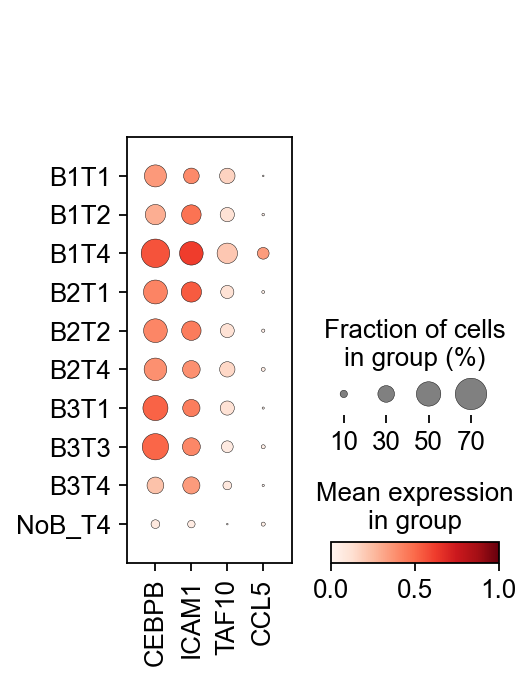

In [31]:
sc.pl.dotplot(adata_epi, ["CEBPB","ICAM1","TAF10","CCL5"]
                          ,groupby=['B_T_patient_cluster'],vmin=0, vmax=1, save='B1T4_markers_in_epi_1.pdf')

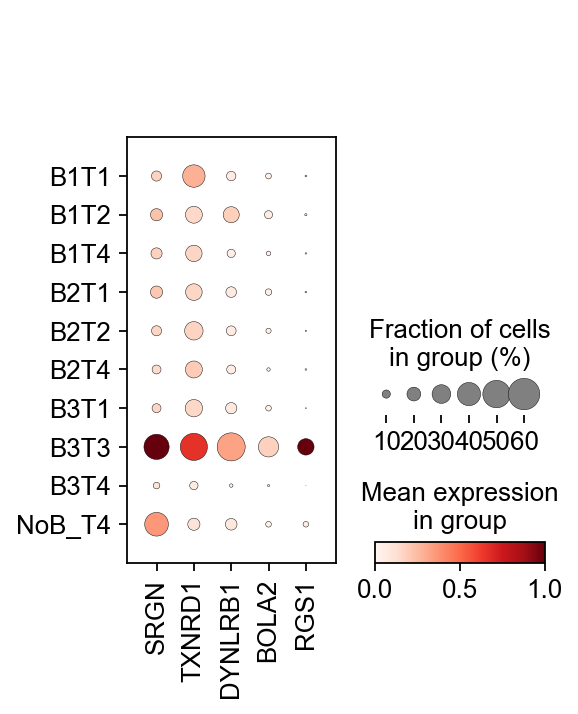

In [33]:
sc.pl.dotplot(adata_epi, [ "SRGN","TXNRD1","DYNLRB1","BOLA2","RGS1"]
                          ,groupby=['B_T_patient_cluster'],vmin=0, vmax=1, save='B3T3_markers_in_epi_1.pdf')

In [34]:
adata_epi.write('epithelial_cell_with_BT_class.h5ad', compression='gzip')

# stopped here

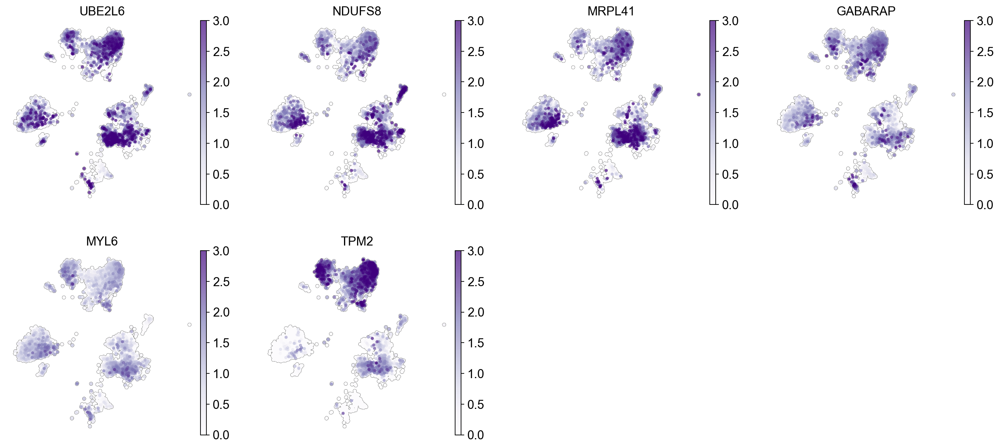

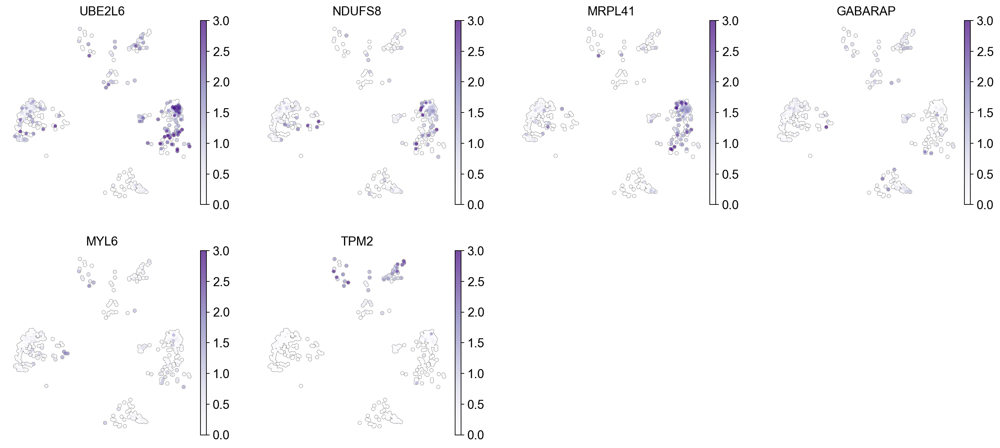

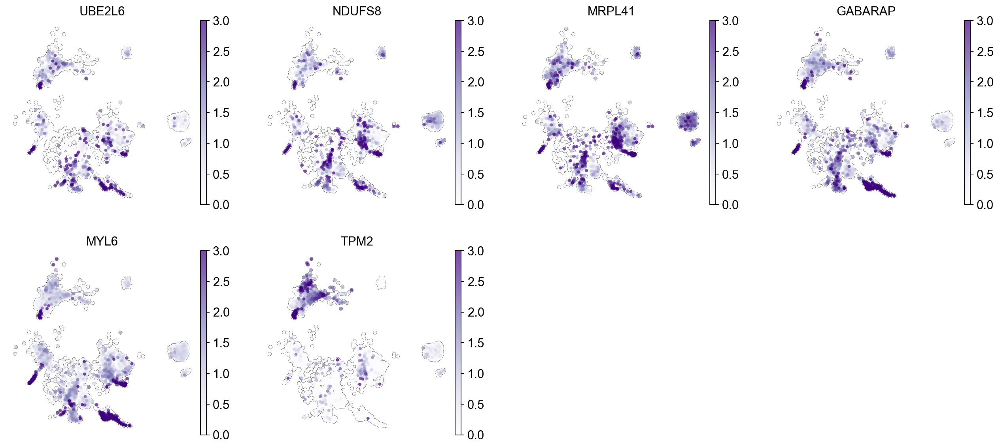

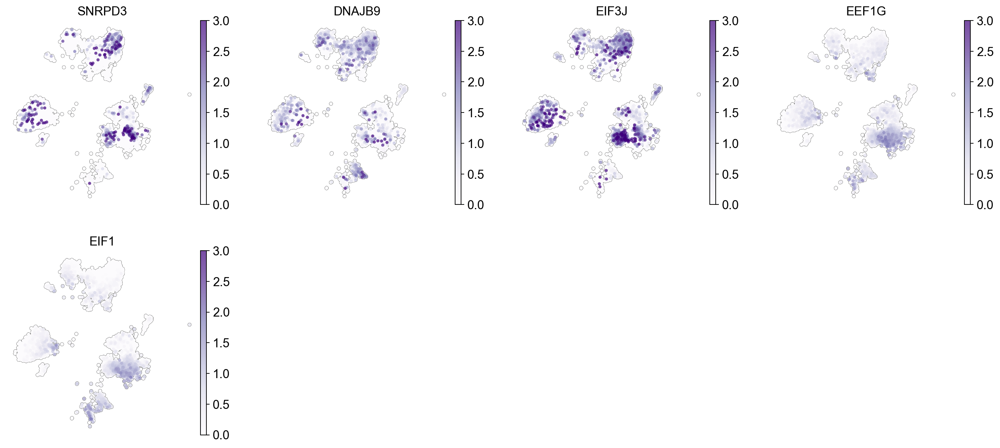

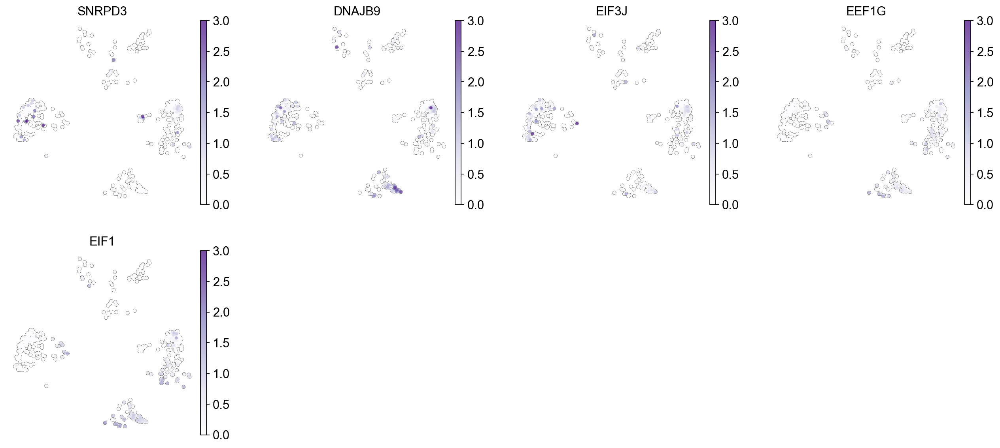

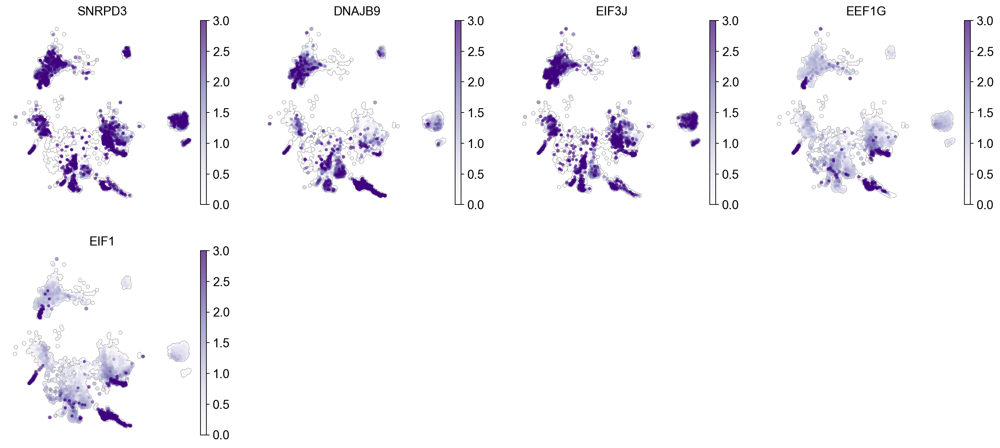

In [20]:
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F1T4'], color=['UBE2L6','NDUFS8','MRPL41','GABARAP','MYL6','TPM2'], legend_loc='right margin', frameon=False, vmin=0,vmax=3,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_F1T4_biomarker_in_F1T4_epi.pdf')
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F3T4'], color=['UBE2L6','NDUFS8','MRPL41','GABARAP','MYL6','TPM2'], legend_loc='right margin', frameon=False, vmin=0,vmax=3,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_F1T4_biomarker_in_F3T4_epi.pdf')
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F4T2'], color=['UBE2L6','NDUFS8','MRPL41','GABARAP','MYL6','TPM2'], legend_loc='right margin', frameon=False, vmin=0,vmax=3,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_F1T4_biomarker_in_F4T2_epi.pdf')

sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F1T4'], color=['SNRPD3','DNAJB9','EIF3J','EEF1G','EIF1'], legend_loc='right margin', frameon=False, vmin=0,vmax=3,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_F4T2_biomarker_in_F1T4_epi.pdf')
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F3T4'], color=['SNRPD3','DNAJB9','EIF3J','EEF1G','EIF1'], legend_loc='right margin', frameon=False, vmin=0,vmax=3,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_F4T2_biomarker_in_F3T4_epi.pdf')
sc.pl.umap(adata_epi[adata_epi.obs['Fibro_T_patient_cluster']=='F4T2'], color=['SNRPD3','DNAJB9','EIF3J','EEF1G','EIF1'], legend_loc='right margin', frameon=False, vmin=0,vmax=3,add_outline=True, outline_width=(0.05,0.05), size=50, use_raw=True, cmap='Purples',save='_F4T2_biomarker_in_F4T2_epi.pdf')

In [22]:
adata_epi

AnnData object with n_obs × n_vars = 133787 × 9685
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'louvain', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'source', 'oligo', 'patient_cluster', 'celltype', 'crude', 'celltype_detail', 'T_patient_cluster4', 'Myeloid_patient_cluster4', 'Myeloid_to_T_cluster44', 'Fibro_patient_cluster', 'Fibro_T_patient_cluster'
    var: 'mt', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-0', 'n_cells-1-0', 'n_cells_by_counts-1-0', 'mean_counts-1-0', 'pct_dropout_by_counts-1-0', 'total_counts-1-0', 'n_cells-2-0', 'n_cells_by_counts-2-0', 'mean_counts-2-0', 'pct_dropout_by_counts-2-0', 'total_counts-2-0', 'feature_types-0', 'gene_ids-0-0', 'n_cells-10-0-0', 'n_cells_by_counts-10-0-0', 'mean_counts-10-0-0', 'pct_dropout_by_counts-10-0-0', 'total_counts-10-0-0', 'n_cells-1

In [13]:
adata_epi_14 = adata_epi[adata_epi.obs['Fibro_T_patient_cluster'].isin(['F1T4','F4T2'])]

In [14]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, format='tif', facecolor='white')

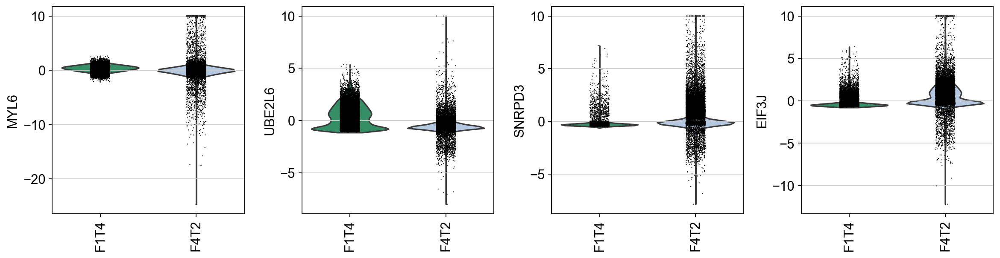

In [25]:
sc.pl.violin(adata_epi_14, keys=['MYL6','UBE2L6','SNRPD3','EIF3J'], groupby='Fibro_T_patient_cluster',
    rotation=90, save='_biomarkers_in_epi_cell_by_FT_class.tif')

In [26]:
adata_epi_14= adata_epi[adata_epi.obs['Fibro_T_patient_cluster'].isin(['F1T4','F4T2'])]

In [15]:
sc.tl.rank_genes_groups(adata_epi_14, 'Fibro_T_patient_cluster', groups=['F1T4','F4T2'], reference='rest', method='t-test', key_added='to_F4T2')

ranking genes
    finished: added to `.uns['to_F4T2']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:13)


In [16]:
result_14 = adata_epi_14.uns['to_F4T2']
groups_14 = result_14['names'].dtype.names
pval_table_14 = pd.DataFrame(
            {group + '_' + key[:2]: result_14[key][group]
            for group in groups_14 for key in ['names', 'pvals_adj']})
pval_table_14

,F1T4_na,F1T4_pv,F4T2_na,F4T2_pv
0,IFITM1,0.0,RPS29,0.0
1,PCBP2,0.0,RPL27A,0.0
2,ALDOA,0.0,RPS20,0.0
3,PTMS,0.0,DYNLRB1,0.0
4,PPDPF,0.0,SNRPD3,0.0
...,...,...,...,...
9680,SNRPD3,0.0,PPDPF,0.0
9681,DYNLRB1,0.0,PTMS,0.0
9682,RPS20,0.0,ALDOA,0.0
9683,RPL27A,0.0,PCBP2,0.0


In [17]:
pval_table_14.loc[pval_table_14['F1T4_na'].isin(['MYL6','UBE2L6','SNRPD3','EIF3J'])]

,F1T4_na,F1T4_pv,F4T2_na,F4T2_pv
13,UBE2L6,0.000000e+00,RPL34,0.000000
1743,MYL6,6.306081e-98,DDX28,0.147821
9678,EIF3J,0.000000e+00,ID3,0.000000
9680,SNRPD3,0.000000e+00,PPDPF,0.000000


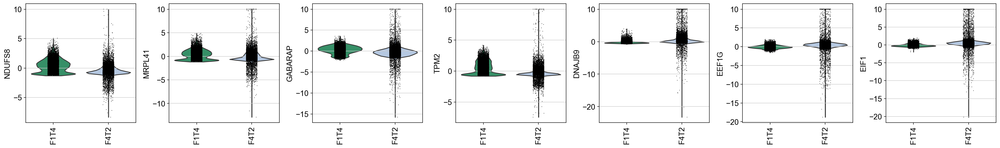

In [18]:
sc.pl.violin(adata_epi_14, keys=['NDUFS8','MRPL41','GABARAP','TPM2','DNAJB9','EEF1G','EIF1'], groupby='Fibro_T_patient_cluster',
    rotation=90, save='_biomarkers_in_epi_cell_by_FT_class_1.tif')

In [19]:
pval_table_14.loc[pval_table_14['F1T4_na'].isin(['NDUFS8','MRPL41','GABARAP','TPM2','DNAJB9','EEF1G','EIF1'])]

,F1T4_na,F1T4_pv,F4T2_na,F4T2_pv
20,TPM2,0.000000e+00,GADD45A,0.000000e+00
26,NDUFS8,0.000000e+00,B2M,1.966127e-306
341,GABARAP,0.000000e+00,RPS21,4.936260e-64
404,MRPL41,2.262361e-296,S1PR2,1.213551e-52
9645,EEF1G,2.126338e-266,TPM1,0.000000e+00
9669,DNAJB9,0.000000e+00,GNB2,0.000000e+00
9675,EIF1,0.000000e+00,SERPINH1,0.000000e+00


# T cell dataset

In [5]:
adata_T = sc.read('T_cell_from_Group_ABC_patients_immune_after_harmony.h5ad')

In [6]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'T_1': ['P010','P008','P021','P049','P020','P062','P032','P016','P061','P012',
                     'P057','P015','P065','P063','P130','P056', 'P011','P127','P126','P001',
                     'P028','P027','P030'],
             'T_2': ['P037','P031','P026','P042','P019','P017','P036','P054','P023','P128',
                     'P048','P002','P104','P087','P094','P084','P079','P107','P076','P089',
                     'P083'],
                     
                   
             'T_3': [ 'P986','P658','P836','P866','P846','P686','P865','P585','P944','P787'],
             'T_4': ['P052','P024','P040','P039','P080','P075','P091','P009B','P082','P022',
                     'P074','P047','P038','P044','P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['T_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'T_patient_cluster4'] = i


In [7]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'Myeloid_1': ['P063','P056','P009B','P075','P011','P032','P016','P104','P087','P089','P036','P083','P052',
                          'P047','P037','P091','P022','P074','P038','P082'],
            'Myeloid_2':  ['P130','P010','P986','P865','P585','P866','P846','P686','P658','P944','P836','P787'],
             'Myeloid_3': ['P040','P024','P017','P031','P026','P023','P049','P021','P107','P076','P079','P048','P062',
                          'P027','P065','P057','P008','P044','P001','P042','P094','P084','P080','P002','P061','P015'],
             'Myeloid_4': ['P128','P054','P019','P127','P126','P030','P028','P039','P020','P012'],
             'No_M': ['P009A']
              }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_patient_cluster4'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_patient_cluster4'] = i


In [8]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'M1toT1': ["P011",	"P016",	"P032",	"P056",	"P063",],
             'M1toT2': ["P036",	"P037",	"P083",	"P087",	"P089",	"P104",],
             'M1toT3': [],
             'M1toT4': ["P009B",	"P022",	"P038",	"P047",	"P052",	"P074",	"P075",	"P082",	"P091",],
             'M2toT1': ["P010",	"P130",],
             'M2toT2': [],
             'M2toT3': ["P585",	"P658",	"P686",	"P787",	"P836",	"P846",	"P865",	"P866",	"P944",	"P986",],
             'M2toT4': [],
             'M3toT1': ["P001",	"P008",	"P015",	"P021",	"P027",	"P049",	"P057",	"P061",	"P062",	"P065",],
             'M3toT2': ["P002",	"P017",	"P023",	"P026",	"P031",	"P042",	"P048",	"P076",	"P079",	"P084",	"P094",	"P107",],
             'M3toT3': [],
             'M3toT4': ["P024",	"P040",	"P044",	"P080",],
             'M4toT1': ["P012",	"P020",	"P028",	"P030",	"P126",	"P127",],
             'M4toT2': ["P019",	"P054",	"P128",],
             'M4toT3': [],
             'M4toT4': ["P039",],
             'NoMtoT4': ["P009A",]
            }

# Initialize empty column in cell metadata
adata_T.obs['Myeloid_to_T_cluster44'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'Myeloid_to_T_cluster44'] = i


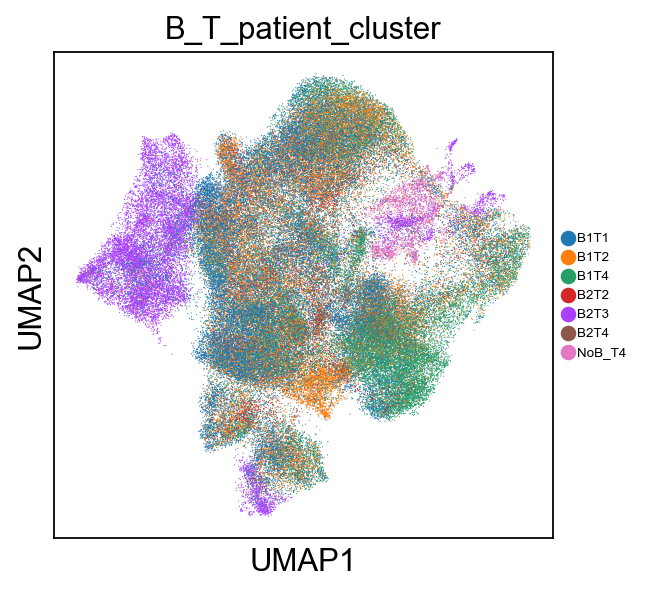

In [11]:
# Fill in the clusters that belong to each cell type based on each marker in the plot above
cell_dict = {'B1T1': ["P065",	"P062",	"P030",	"P057",	"P063",	"P012",	"P056",	"P027",	"P008",	"P001",	"P130",	"P028",	"P011",	"P126",	"P061",	"P010",	"P021",	"P015",	"P020",	"P032",	"P127",	"P049",	"P016",
],
             'B1T2':["P104",	"P128",	"P054",	"P002",	"P079",	"P076",	"P023",	"P084",	"P087",	"P017",	"P026",	"P042",	"P083",	"P019",	"P036",	"P037",	"P089",
],
             'B1T3':[],
             'B1T4':["P074",	"P052",	"P039",	"P075",	"P091",	"P009B",	"P024",	"P022",	"P080",	"P082",	"P047",	"P038",
],
            
             'B2T1': [],
            'B2T2': ["P048",	"P094",	"P031",	"P107",
],
             'B2T3':["P866",	"P836",	"P846",	"P986",	"P585",	"P658",	"P865",	"P944",	"P787",	"P686",
],
             'B2T4':["P040",	"P044",
]
        ,     'NoB_T4':['P009A']
             
              }

# Initialize empty column in cell metadata
adata_T.obs['B_T_patient_cluster'] = np.nan

# Generate new assignments
for i in cell_dict.keys():
    ind = pd.Series(adata_T.obs.patient).isin(cell_dict[i])
    adata_T.obs.loc[ind,'B_T_patient_cluster'] = i

sc.pl.umap(adata_T, color=['B_T_patient_cluster'], legend_loc='right margin', legend_fontsize=6,)# save='umap_Fibro_T_patient_cluster_in_T_cell.pdf')


ranking genes
    finished: added to `.uns['B_T_class_rank_in_T']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:03:27)


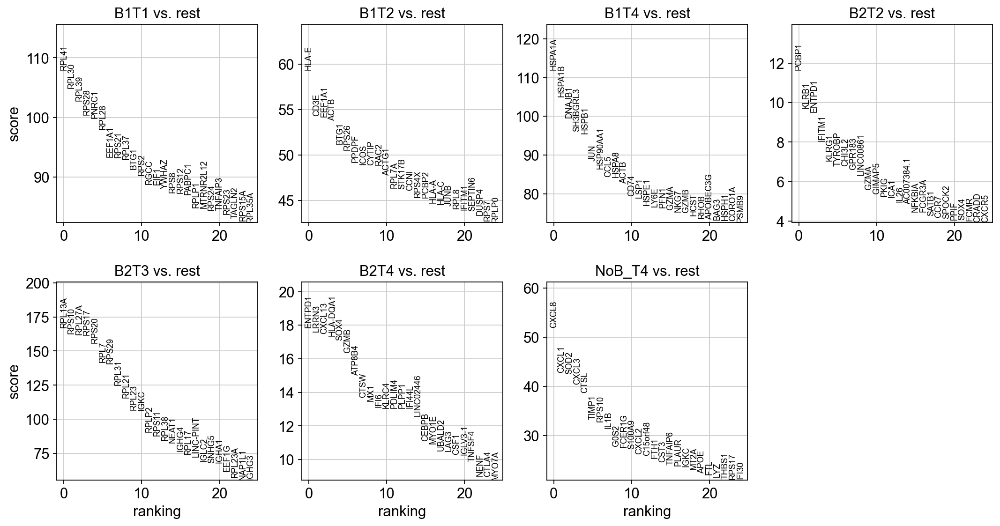

In [12]:
sc.tl.rank_genes_groups(adata_T, 'B_T_patient_cluster', method='wilcoxon', key_added = "B_T_class_rank_in_T")
sc.pl.rank_genes_groups(adata_T, n_genes=25, sharey=False, key = "B_T_class_rank_in_T")

In [14]:
df=pd.DataFrame(adata_T.uns['B_T_class_rank_in_T']['names'])
df.to_csv("F:/Ko/67ESCC_PCN_integration_07-19-22/immune_cell_T4_M4/B_T_Cell_in_T.csv",
                 sep=',', na_rep='', float_format=None, columns=None, header=True, 
                 index=True, index_label=None, mode='w', encoding=None, compression='infer', 
                 quoting=None, quotechar='"', line_terminator=None, chunksize=None, date_format=None)

In [ ]:
#B1T4
sc.pl.dotplot(adata_T, ["HSPA1B",	"HSPB1",	"HSPA1A",	"DNAJB1",	"RHOB",	"BAG3",	"SH3BGRL3",	"JUN",	"HSPA6",	"NKG7",	"CCL5",	"RGS2",	"DNAJB4",	"ACTB",	"GZMA",	"PPP1R15A",	"CTSD",	"ID2",	"SERPINH1",	"GZMB",	"CD74",	"HCST",	"HLA-DPA1",	"RAC2",	"CACYBP",	"PRF1",	"CCL3",	"LSP1",	"CD8A",	"PFN1",	"ACTG1"
], groupby=['B_T_patient_cluster'])

sc.pl.dotplot(adata_T, ["LAG3",	"HSP90AA1",	"ZFAND2A",	"CORO1A",	"LGALS1",	"CCL4",	"HAVCR2",	"PSMB9",	"MYL12A",	"CXCL13",	"HSPA8",	"GZMH",	"APOBEC3G",	"HSPE1",	"LY6E",	"CTSC",	"ID3",	"CD63",	"HLA-DPB1",	"NR4A1",	"CKLF",	"CD52",	"PTPN6",	"DUSP1",	"CD8B",	"UBB",	"HSPD1",	"TMSB10",	"HLA-DRA",	"CFL1"
], groupby=['B_T_patient_cluster'])


In [ ]:
#B1T4
#BAG3
sc.pl.dotplot(adata_T, ['HSPA1B','HSPB1','RHOB','BAG3','HSPA6','CCL3','ZFAND2A','ID3','CD63','PTPN6'], groupby=['B_T_patient_cluster'])#, save='M1T4_marker_in_T_cell(5).pdf')
sc.pl.dotplot(adata_T, ['HSPA1B','HSPB1','RHOB','BAG3','HSPA6'], groupby=['B_T_patient_cluster'], save='B1T4_marker_in_T_cell.pdf')


In [ ]:
#B2T4
sc.pl.dotplot(adata_T, ["RPL13A",	"RPL27A",	"RPS17",	"RPS10",	"RPS20",	"RPS29",	"RPL7",	"RPL31",	"RPL21",	"RPL23",	"IGKC",	"RPLP2",	"RPL38",	"RPS11",	"RPL17",	"NEAT1",	"IGHG4",	"SNHG5",	"LINC-PINT",	"IGLC2",	"EEF1G",	"RPS27",	"NAP1L1",	"RPL23A",	"RPS6",	"IGHA1",	"RPL27",	"GAS5",	"RPS16",	"DYNLRB1",	"IGHG3"

], groupby=['B_T_patient_cluster'])#, save='M1T4_marker_in_T_cell(5).pdf')
sc.pl.dotplot(adata_T, ["AC016831.5",	"RPS18",	"RPL36A",	"RPL35",	"CXCL8",	"RPL34",	"EVI2A",	"AC092338.3",	"HMGB2",	"SNHG32",	"SNRPD3",	"RPL3",	"RPL37A",	"CXCR4",	"TRAC",	"RPL9",	"UQCRB",	"RPL15",	"AC058791.1",	"EVI2B",	"UBA52",	"IGLC1",	"ATP1B3",	"CXCL1",	"GPR171",	"IGHG1",	"C1orf56",	"LINC00513",	"AC114760.2",	"RPL36"

], groupby=['B_T_patient_cluster'])#, save='M1T4_M3T4_marker_in_T_cell.pdf')



In [ ]:
#B2T4
#nothing related to prognosis
sc.pl.dotplot(adata_T, ['IGKC','NEAT1','IGHG4','LINC-PINT','IGLC2','IGHA1','IGHG3','CXCL8',
                       'SNRPD3','IGLC1','CXCL1'], groupby=['B_T_patient_cluster'])#, save='M2T2_marker_in_T_cell.pdf')
sc.pl.dotplot(adata_T, ['IGKC','LINC-PINT','IGHG4','IGHA1',
                       'SNRPD3'], groupby=['B_T_patient_cluster'], save='B2T4_marker_in_T_cell.pdf')

In [ ]:
#B1T4, B2T4 markers
sc.pl.dotplot(adata_T, ['HSPA1B','HSPB1','RHOB','BAG3','HSPA6'
    ,'IGKC','LINC-PINT','IGHG4','IGHA1','SNRPD3'], groupby=['B_T_patient_cluster'], save='B1T4_B2T4_marker_in_T_cell.pdf')

In [ ]:
adata_T.write('T_cell_05-10-23.h5ad', compression='gzip')

In [5]:
adata_T = sc.read('T_cell_05-10-23.h5ad')

In [15]:
adata = adata_T
adata.obs

,n_genes,n_genes_by_counts,total_counts,total_counts_mt,pct_counts_mt,tissue,patient,leiden,batch,total_counts_ribo,...,celltype,crude,celltype_detail,patient_cluster,dataset,T_patient_cluster,T_patient_cluster4,Myeloid_to_T_cluster44,Myeloid_patient_cluster4,B_T_patient_cluster
AAACCTGAGTAGCCGA-1-0-0,3934.0,3879,1452.073242,18.802568,1.294877,tumor,P686,6,0,198.197769,...,6,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B2T3
AAACCTGCAAGAGGCT-1-0-0,674.0,669,882.995728,11.229170,1.271713,tumor,P686,6,0,213.666718,...,6,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B2T3
AAACCTGCAGTATCTG-1-0-0,1014.0,1003,956.411804,18.788149,1.964441,tumor,P686,6,0,221.148575,...,6,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B2T3
AAACCTGGTGCCTGGT-1-0-0,896.0,885,1091.559448,17.238060,1.579214,tumor,P686,6,0,176.360626,...,6,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B2T3
AAACCTGGTGCGCTTG-1-0-0,786.0,772,876.556519,18.123993,2.067635,tumor,P686,6,0,217.813019,...,6,T cell,CD8 T cell,Group A,Dinh dataset,NaN,T_3,M2toT3,Myeloid_2,B2T3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGGTTAGCAAATCA-1-24-2,1375.0,1351,1476.700806,22.369625,1.514838,tumor,P001,1,2,184.743835,...,1,T cell,effector T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B1T1
TTTGGTTAGTGGTAAT-1-24-2,1606.0,1573,1480.355835,29.242380,1.975362,tumor,P001,4,2,188.684555,...,4,T cell,CD4 T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B1T1
TTTGGTTCAAGCCATT-1-24-2,4456.0,4328,1867.209229,29.546848,1.582407,tumor,P001,0,2,172.502136,...,0,T cell,CD4 T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B1T1
TTTGTCAGTCCTCTTG-1-24-2,2711.0,2644,1972.602417,24.433256,1.238631,tumor,P001,10,2,120.637726,...,10,T cell,exhausted T cell,Group A,Zhang dataset,NaN,T_1,M3toT1,Myeloid_3,B1T1


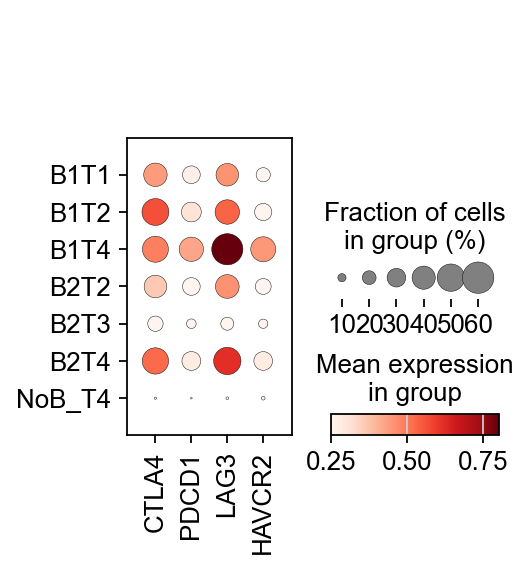

In [20]:
Texcell_geneset = ['CTLA4','PDCD1','LAG3','HAVCR2'] # exhausted T cell
sc.pl.dotplot(adata, Texcell_geneset,vmin=0.25, vmax=0.8, groupby=['B_T_patient_cluster'], save='exhausted_T_markers_in_T_cells_from_BtoT_clusters.pdf')

In [17]:
sc.tl.rank_genes_groups(adata, 'B_T_patient_cluster', method='t-test')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:26)


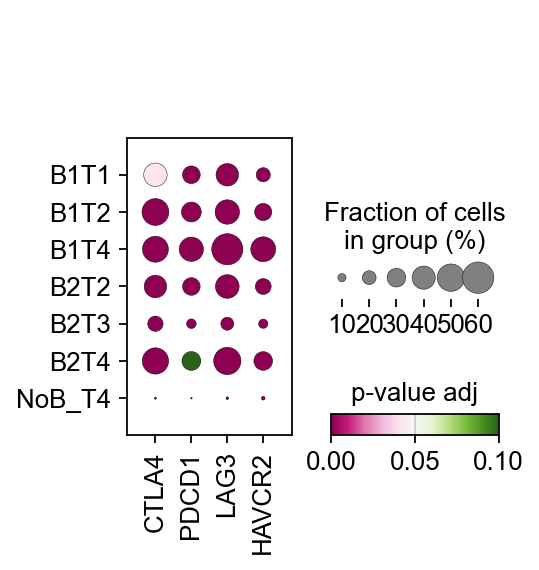

In [18]:
markers = ['CTLA4','PDCD1','LAG3','HAVCR2']
sc.pl.rank_genes_groups_dotplot(adata, var_names= markers, values_to_plot='pvals_adj', key='rank_genes_groups',vmax=0.1, dendrogram=False,color_map='PiYG', save='_exhausted_T_markers_in_T_cell_by_BT_class_pval.pdf')

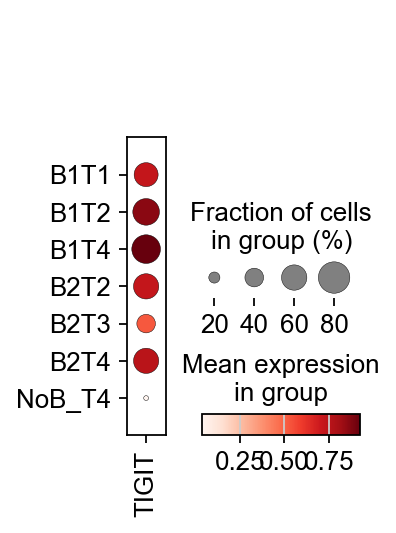

In [21]:
sc.pl.dotplot(adata, ['TIGIT'], groupby=['B_T_patient_cluster'], save='TIGIT_in_T_cells_from_BtoT_clusters.pdf')

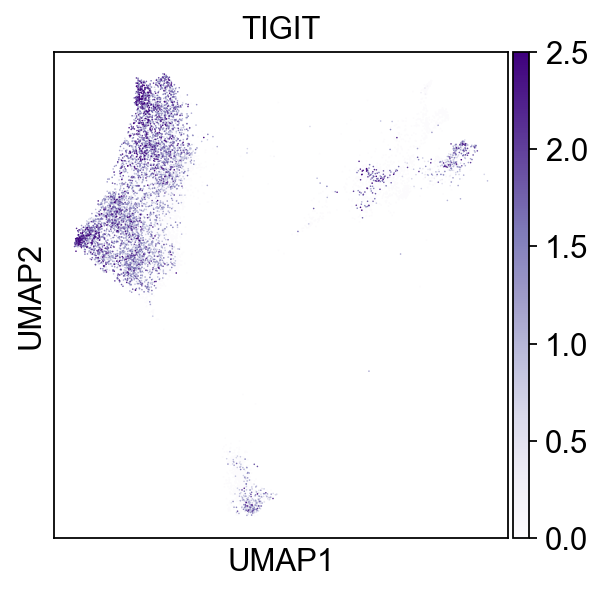

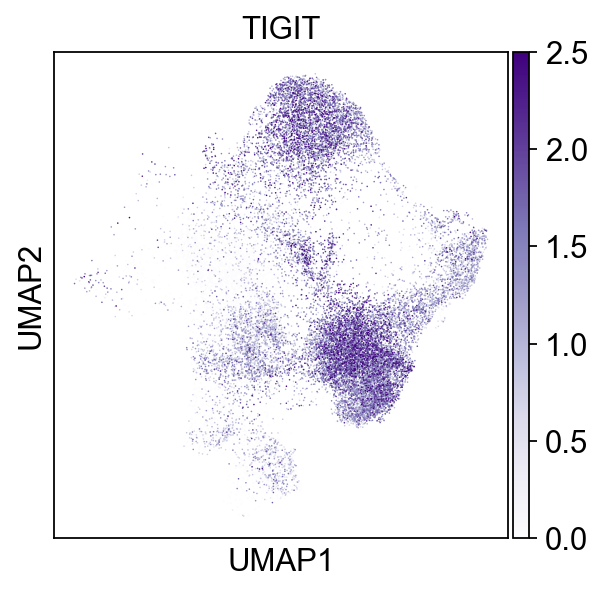

In [23]:
sc.pl.umap(adata[adata.obs['B_T_patient_cluster']=='B2T3'],vmin=0, vmax=2.5,size=2, use_raw=True, cmap='Purples', color=['TIGIT'])
sc.pl.umap(adata[adata.obs['B_T_patient_cluster']=='B1T4'],vmin=0, vmax=2.5,size=2, use_raw=True, cmap='Purples', color=['TIGIT'])#, save='TGITI_in_T_cells_from_FtoT_clusters.pdf')

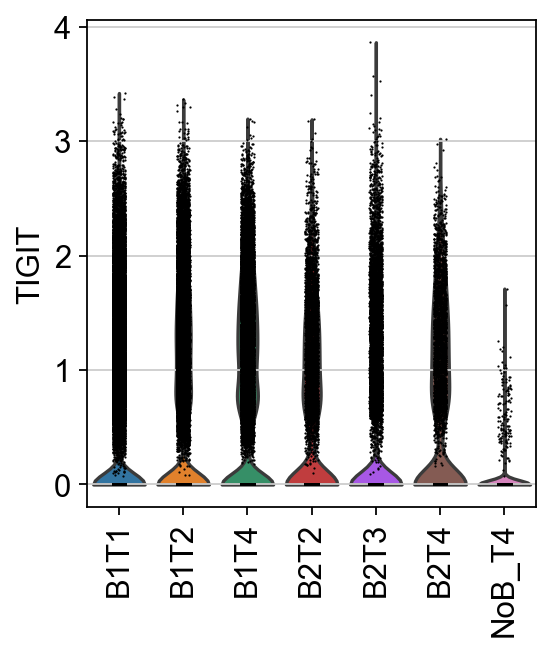

In [24]:
sc.pl.violin(adata, keys=['TIGIT'], groupby='B_T_patient_cluster',
    rotation=90)#, save='_BAG3_SNRPD3_in_T_cell.tif')

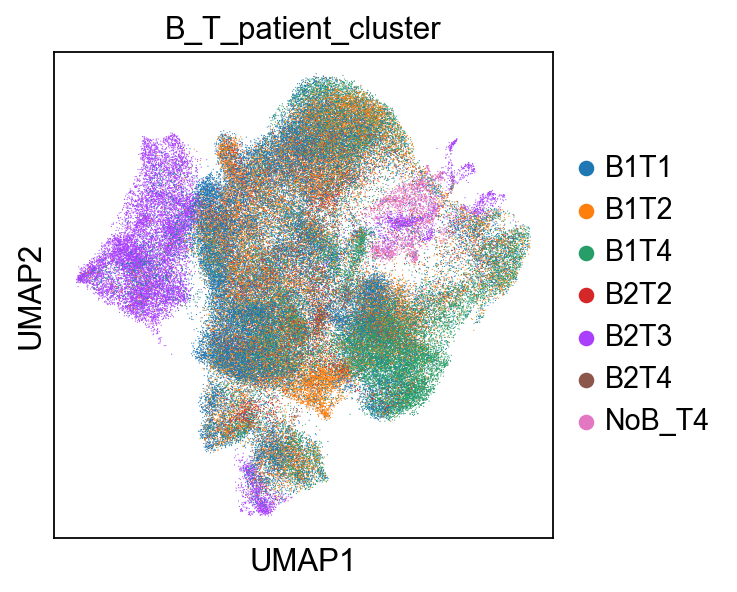

In [25]:
sc.pl.umap(adata, color=['B_T_patient_cluster'])

In [26]:
adata

AnnData object with n_obs × n_vars = 114974 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_to_T_cluster44', 'Myeloid_patient_cluster4', 'B_T_patient_cluster'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_counts-0-

saving figure to file ./figures/scvelo__scatterplot_T_cell_BtoT_cluster.pdf


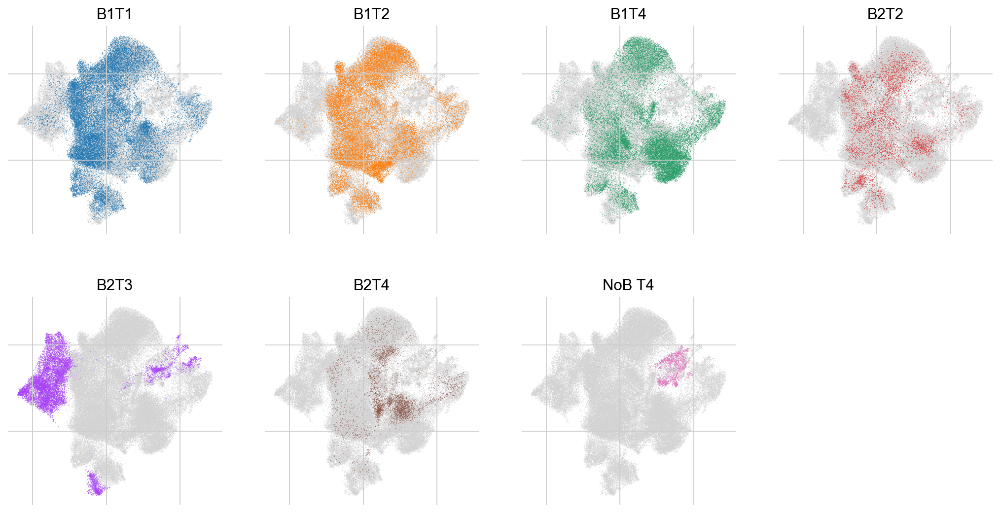

In [27]:
scv.pl.scatter(adata, groups=[[c] for c in adata.obs['B_T_patient_cluster'].cat.categories], color='B_T_patient_cluster', ncols=4, save="_scatterplot_T_cell_BtoT_cluster.pdf")

In [28]:
scv.set_figure_params(style='scvelo', dpi=100, dpi_save=300, frameon=None)

saving figure to file ./figures/scvelo__scatterplot_T_cell_BtoT_cluster.pdf


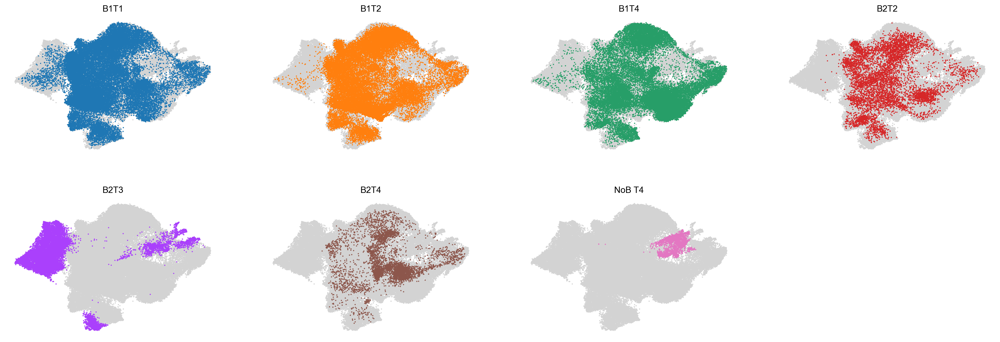

In [29]:
scv.pl.scatter(adata, groups=[[c] for c in adata.obs['B_T_patient_cluster'].cat.categories], color='B_T_patient_cluster', ncols=4, save="_scatterplot_T_cell_BtoT_cluster.pdf")

In [30]:
adata_T_F1T4 = adata[adata.obs['B_T_patient_cluster'].isin(['B1T4','B2T3'])]
adata_T_F1T4

View of AnnData object with n_obs × n_vars = 40898 × 12499
    obs: 'n_genes', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'tissue', 'patient', 'leiden', 'batch', 'total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'pct_counts_hb', 'percent_mt2', 'n_counts', 'celltype', 'crude', 'celltype_detail', 'patient_cluster', 'dataset', 'T_patient_cluster', 'T_patient_cluster4', 'Myeloid_to_T_cluster44', 'Myeloid_patient_cluster4', 'B_T_patient_cluster'
    var: 'gene_ids', 'mt', 'feature_types-10', 'feature_types-11', 'feature_types-12', 'feature_types-13', 'feature_types-14', 'feature_types-15', 'feature_types-16', 'feature_types-17', 'feature_types-18', 'feature_types-19', 'feature_types-20', 'feature_types-21', 'feature_types-3', 'feature_types-4', 'feature_types-5', 'feature_types-6', 'feature_types-7', 'feature_types-8', 'feature_types-9', 'feature_types-0', 'n_cells-0-0', 'n_cells_by_counts-0-0', 'mean_counts-0-0', 'pct_dropout_by_counts-0-0', 'total_co

In [31]:
sc.tl.rank_genes_groups(adata_T_F1T4, 'B_T_patient_cluster', method='t-test')

ranking genes


MemoryError: Unable to allocate 1.90 GiB for an array with shape (40898, 12499) and data type float32

In [ ]:
result_T_F1T4 = adata_T_F1T4.uns['rank_genes_groups']
groups_T_F1T4 = result_T_F1T4['names'].dtype.names
pval_table_T_F1T4 = pd.DataFrame(
            {group + '_' + key[:2]: result_T_F1T4[key][group]
            for group in groups_T_F1T4 for key in ['names', 'pvals_adj']})
pval_table_T_F1T4

In [22]:
pval_table_T_F1T4.loc[pval_table_T_F1T4['F1T4_na'].isin(['BAG3','SNRPD3'])]

,F1T4_na,F1T4_pv,F4T2_na,F4T2_pv
34,BAG3,0.0,RPS18,0.0
12298,SNRPD3,0.0,PPP1R15A,0.0


In [23]:
sc.settings.set_figure_params(dpi=80,dpi_save=300, facecolor='white', format='tif')

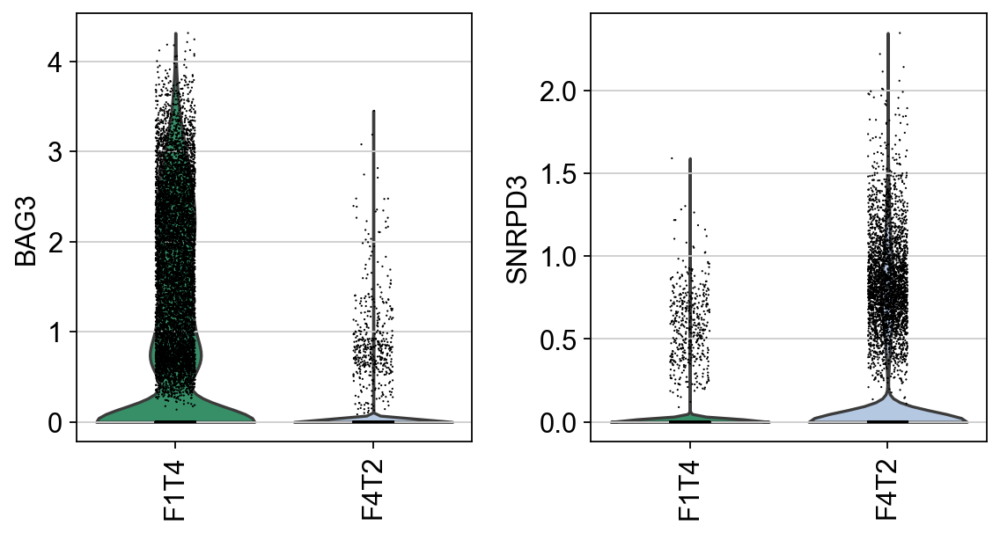

In [18]:
sc.pl.violin(adata_T_F1T4, keys=['BAG3','SNRPD3'], groupby='B_T_patient_cluster',
    rotation=90, save='_BAG3_SNRPD3_in_T_cell.tif')

In [25]:
pval_table_T_F1T4.loc[pval_table_T_F1T4['F1T4_na'].isin(['TIGIT'])]

,F1T4_na,F1T4_pv,F4T2_na,F4T2_pv
837,TIGIT,0.0,ZNF829,0.069055


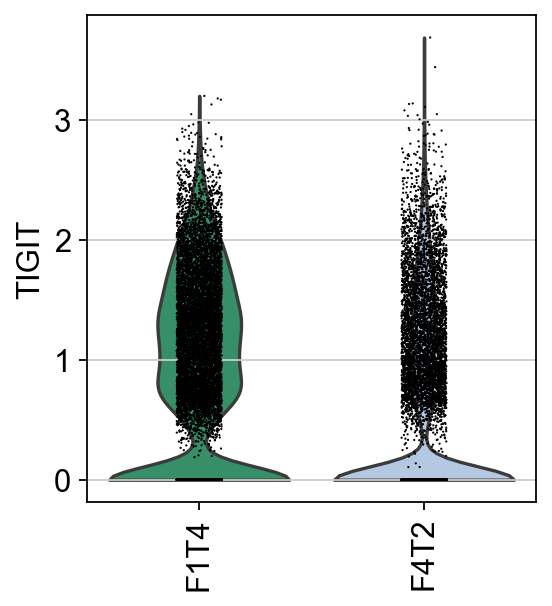

In [24]:
sc.pl.violin(adata_T_F1T4, keys=['TIGIT'], groupby='B_T_patient_cluster',
    rotation=90, save='_TIGIT_in_T_cell_from_B1T4_B2T3.tif')